<font style="font-size:96px; font-weight:bolder; color:#0040a0"><img src="http://montage.ipac.caltech.edu/docs/M51.jpg" style="float: right; padding: 70px 0px 0px 50px;" /></font>

# Building a Mosaic with Montage

Montage is a general toolkit for reprojecting and mosaicking astronomical images and generally you have to marshall the specific data you want to use carefully.  But there are a few large-scale uniform surveys that cover a large enough portion of the sky to allow a simple location-based approach.

<p style="color:#c00000;">In this notebook we will choose a region of the sky and dataset to mosaic, retrieve the archive data, reproject and background-correct the images, and finally build an output mosaic.  You are free to modify any of the mosaic parameters but beware that as you go larger all of the steps will take longer (possibly <b>much</b> longer).  If you do this for three different wavelenths, you can put them together in a full-color composite using our <a style="text-decoration: none;" href="mViewer.ipynb"> Sky Visualization </a> notebook, which produced the image on the right.</p>

As with many notebooks, this was derived from a longer script by breaking the processing up into sequential steps.
These steps (cells) have to be run one in sequence.  Wait for each cell to finish (watch for the step number in the brackets on the left to stop showing an asterisk) before starting the execution of next cell or run them all as a set.

If you want to just see the code without all the explanation, check out <a style="text-decoration: none; color: #c00000;" href="Mosaic_oneshot.ipynb">this example</a>.



## Setup

The Montage Python package is a mixture of pure Python and Python binary extension code.  It can be downloaded using <tt style="color: #c00000;">pip install MontagePy</tt>

No other installations are necessary.  

In [1]:
# Startup.  The Montage modules are pretty much self-contained
# but this script needs a few extra utilities.

import os
import sys
import shutil

from MontagePy.main    import *
from MontagePy.archive import *

from IPython.display import Image


# These are the parameters defining the mosaic we want to make.

location  = "M 17"
size      = 1.0
dataset   = "2MASS J"
workdir   = "Messier017"


So not much to see so far.  We've defined a location on the sky (which can be either an object name (<i>e.g.</i> "<tt style="color: #c00000;">Messier 017</tt>") or coordinates.  The coordinate parser is pretty flexible; "<tt style="color: #c00000;">3h 29m 53s +47d 11m 43s</tt>" (defaults to the Equatorial J2000 system), "<tt style="color: #c00000;">201.94301 47.45294 Equ B1950</tt>" and "<tt style="color: #c00000;">104.85154 68.56078 Galactic</tt>" all work.  We've also defined a size.  In this case we are going to use this below to construct a simple North-up gnomonic projection square box on the sky; you are free to define any header you like as Montage supports all standard astronomical projections and coordinate systems.

## Working Environment

Before we get to actually building the mosaic, we need to set up our working environment.  Given the volume of data possible, the Montage processing is file based and we need to set up some subdirectories to hold bits of it.  This will all be under an instance-specific directory specified above ("workdir").  It is best not to use directory names with embedded spaces.

In [2]:
# We create and move into subdirectories in this notebook 
# but we want to come back to the original startup directory 
# whenever we restart the processing. 

try:
    home
except:
    home = os.getcwd()

os.chdir(home)

print("Startup folder: " + home)


# Clean out any old copy of the work tree, then remake it
# and the set of the subdirectories we will need.

try:
    shutil.rmtree(workdir)
except:
    print("                Can't delete work tree; probably doesn't exist yet", flush=True)

print("Work directory: " + workdir, flush=True)

os.makedirs(workdir)  

os.chdir(workdir)

os.makedirs("raw")
os.makedirs("projected")
os.makedirs("diffs")
os.makedirs("corrected")


Startup folder: /Users/jcg/FormalTest/MontageNotebooks
                Can't delete work tree; probably doesn't exist yet
Work directory: Messier017


## Retrieving Data from an Archive

Now the first bit of Montage processing.  Montage uses standard FITS files throughout and FITS files have all the metadata describing the image (for us that mainly means pixel scale, projection type and center, rotation and so on).  To drive the processing we need a "FITS header" specification from the user, which we capture in a header "template" file that looks just like a FITS header though with newlines (FITS headers have fixed 80-character card images with no line breaks).  The mHdr routine is a utility that creates a simple FITS header template with limited control over all the above (<i>e.g.</i> the projection is always gnomonic (TAN)).  Other common options are to use a header extracted from some pre-existing FITS file (to create a matching mosaic) or to use mMakeHdr, which fits a bounding box around a set of images (usually the ones you are about to mosaic).

We also use the location and size to retrieve the data we want from a remote archive.  Montage provides an image metadata search service (using mSearch &mdash; a very fast R-Tree / memory-mapped utility &mdash; for most datasets).  This service returns URLs for all the images covering the region of interest, which are then downloaded.

There are many other ways to find images.  The International Virtual Astronomy Alliance (IVOA) has developed a couple of standards for querying metadata (Simple Image Access: SIAP and Table Access Protocol: TAP) which many data providers support.  Our service is focused on a few large uniform datasets (2MASS, DSS, SDSS, WISE).  Other datasets require more care.  For instance, simply downloading all pointed observations of a specific region for a non-survey instrument will include a wide range of integration times (and therefore noise levels) and the mosaicking should involve user-specified weighting of the images (which Montage supports but does not define).

In [3]:
# Create the FITS header for the mosaic.

rtn = mHdr(location, size, size, "region.hdr")

print("mHdr:             " + str(rtn), flush=True)


# Retrieve archive images covering the region then scan 
# the images for their coverage metadata.

rtn = mArchiveDownload(dataset, location, size, "raw")

print("mArchiveDownload: " + str(rtn), flush=True)

rtn = mImgtbl("raw", "rimages.tbl")

print("mImgtbl (raw):    " + str(rtn), flush=True)


mHdr:             {'status': '0', 'count': 16}
mArchiveDownload: {'status': '0', 'count': 49}
mImgtbl (raw):    {'status': '0', 'count': 49, 'badfits': 0, 'badwcs': 0}


## Reprojecting the Images

In the last step above, we generated a list of all the images (with projection metadata) that had been successfully downloaded.  Using this and header template from above, we can now reproject all the images to a common frame.

Montage supplies four different reprojection modules to fit different needs.  mProject is completely general and is flux conserving but this results in it being fairly slow.  For a subset of projections (specifically where both the source and destination are tangent-plane projections) we can use a custom plane-to-plane algorithm developed by the Spitzer Space Telescope).  While mProjectPP only supports a subset of cases, they are extremely common ones.  mProjectPP is also flux conserving.

For fast reprojection, we relax the flux conservation requirement. However, even though we call attention to this explicitly in the name of the module: mProjectQL (quick-look), the results are indistinguishable from the other algorithms for all the tests we have run.

The fourth reprojection module, mProjectCube, is specifically for three- and four-dimensional datacubes.

mProjExec is a wrapper around the three main reprojection routines that determines whether mProjectPP or mProject should be used for each image (unless overridden with mProjectQL as here).  There is one final twist:  FITS headers allow for distortion parameters.  While these were introduced to deal with instrumental distortions, we can often use them to mimic an arbitrary projection over a small region with a distorted gnomonic projection.  This allows us to use mProjectPP over a wider range of cases and still have flux conservation with increased speed.

In [4]:
# Reproject the original images to the  frame of the 
# output FITS header we created

rtn = mProjExec("raw", "rimages.tbl", "region.hdr", projdir="projected", quickMode=True)

print("mProjExec:           " + str(rtn), flush=True)

mImgtbl("projected", "pimages.tbl")

print("mImgtbl (projected): " + str(rtn), flush=True)


mProjExec:           {'status': '0', 'count': 49, 'failed': 0, 'nooverlap': 0}
mImgtbl (projected): {'status': '0', 'count': 49, 'failed': 0, 'nooverlap': 0}


## Coadding for a Mosaic

Now that we have a set of image all reprojected to a common frame, we can coadd them into a mosaic.  

In [5]:
# Coadd the projected images without backgound correction.
# This step is just to illustrate the need for background correction
# and can be omitted.

rtn = mAdd("projected", "pimages.tbl", "region.hdr", "uncorrected.fits")

print("mAdd:    " + str(rtn), flush=True)

mAdd:    {'status': '0', 'time': 1.0}


## View the Image

FITS files are binary data structures. To see the image we need to render to a JPEG or PNG form.  This involves choosing a stretch, color table (if it is a single image as here) and so on.  Montage provides a general visualization tool (mViewer) which can process a single image or multiple images for full color.  It supports overlays of various sorts.  One of its most useful features is a custom stretch algorithm which is based on gaussian-transformed histogram equalization, optionally with an extra logarithmic transform for really bright excursions.  A large fraction of astronomical images share the general characteristics of having a lot of pixels with something like a gaussian distribution at a low flux level (either background noise of low-level sky structure) coupled with a long histogram tail of very bright point-like sources.  If we apply our algorithm to this, stretching from the -2 or -1 "sigma" value of the low-level distribution to the image brightness maximum we usually get a good balance of seeing the low-level structure while still seeing the structure and brightness variations of the bright sources.

mViewer specifications can become quite lengthy so the module provides three entry mechanisms.  The most terse (used here) is a "parameter string" based on the command-line arguments of the original stand-alone C program.  For more complicated descriptions the user can define a JSON string or JSON file.  See the <a style="text-decoration: none; color: #c00000" href="mViewer.ipynb"> Sky Visualization </a> notebook example.

We use the built-in IPython.display utility to show the resultant image, which shrinks it to fit.  There are several other tools you can use instead.

mViewer: {'status': '0', 'type': b'grayscale', 'nx': 3601, 'ny': 3600, 'grayminval': 140.15615325038922, 'grayminpercent': 0.0, 'grayminsigma': -2.0, 'graymaxval': 10630.5380859375, 'graymaxpercent': 100.0, 'graymaxsigma': 1709.2678210239994, 'blueminval': 0.0, 'blueminpercent': 0.0, 'blueminsigma': 0.0, 'bluemaxval': 0.0, 'bluemaxpercent': 0.0, 'bluemaxsigma': 0.0, 'greenminval': 0.0, 'greenminpercent': 0.0, 'greenminsigma': 0.0, 'greenmaxval': 0.0, 'greenmaxpercent': 0.0, 'greenmaxsigma': 0.0, 'redminval': 0.0, 'redminpercent': 0.0, 'redminsigma': 0.0, 'redmaxval': 0.0, 'redmaxpercent': 0.0, 'redmaxsigma': 0.0, 'graydatamin': 142.23333740234375, 'graydatamax': 10630.5380859375, 'bdatamin': 0.0, 'bdatamax': 0.0, 'gdatamin': 0.0, 'gdatamax': 0.0, 'rdatamin': 0.0, 'rdatamax': 0.0, 'flipX': 0, 'flipY': 1, 'colortable': 1, 'bunit': b''}


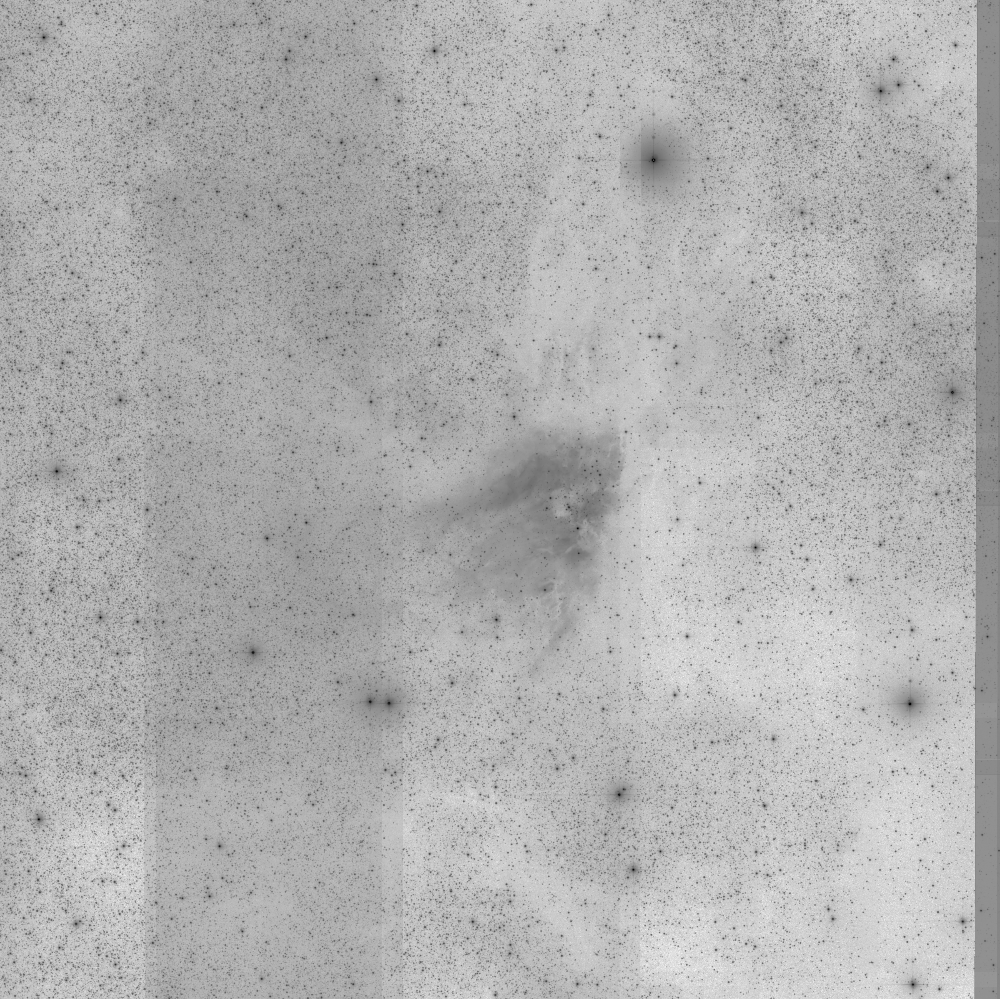

In [6]:
# Make a PNG rendering of the data and display it.

rtn = mViewer("-ct 1 -gray uncorrected.fits -2s max gaussian-log -out uncorrected.png", "", mode=2)

print("mViewer: " + str(rtn), flush=True)

Image(filename='uncorrected.png')

## Background Matching

We can do better.  In the above image (at least in the original example, it may vary if you've chosen another dataset) there are vertical stripes.  Even though the images were accurately flux-calibrated the background levels in the individual image varied due to real changes in the brightness of the sky (2MASS data was taken from the ground, so the atmosphere was a variable).

This is a common problem; differential photometry is easier than absolute.  So Montage provides tools for determining what is essentially a compromise background:  Not flattened (since in the above mosaic there is real structure throughout the image) and not modelled (there might be a model you can develop for the Galactic structure above but it wouldn't do that good a job of cleaning up the mosaic). 

Rather, we ask what is the set of minimum adjustments we can make to the individual image backgrounds to bring them all in-line with each others.  Often, this is just a constant offset; at most it includes slight slopes.  Anything more and we are starting to fit the sky structure rather than the background differences.

The first steps is determining the corrections is to analyze the overlap areas between adjacent images.  We determine from the image metadata (which again includes sky coverage) where there are overlaps.  Then for each pairwise overlap, we compute the image difference.  There is an explicit assumption here that a such a pair the sources and other real-sky structure match (including flux scales) so the difference should have nothing in it but background differences.  We then fit each difference with a plane (ignoring large excursions just to be safe).

Finally, given this set of difference fits, we determine iteratively a global mimimum difference which results in a set of corrections to each image.

In [7]:
# Determine the overlaps between images (for background modeling).

rtn = mOverlaps("pimages.tbl", "diffs.tbl")

print("mOverlaps:    " + str(rtn), flush=True)


# Generate difference images and fit them.

rtn = mDiffFitExec("projected", "diffs.tbl", "region.hdr", "diffs", "fits.tbl")

print("mDiffFitExec: " + str(rtn), flush=True)


# Model the background corrections.

rtn = mBgModel("pimages.tbl", "fits.tbl", "corrections.tbl")

print("mBgModel:     " + str(rtn), flush=True)


mOverlaps:    {'status': '0', 'count': 128}
mDiffFitExec: {'status': '0', 'count': 128, 'diff_failed': 0, 'fit_failed': 0, 'warning': 0}
mBgModel:     {'status': '0'}


## Background Correcting and Re-Mosaicking

Now all we have to do is apply the background corrections to the individual images and regenerate the mosaic.  While we don't attempt to maintain the global total flux (this would be meaningless in any case given the source of the offsets), in general our final mosaic is close to this level.

For those cases where the background should truly be flat (extragalactic fields with no foreground we want to keep) Montage also provides simple "flattening" tools.

In [8]:
# Background correct the projected images.

rtn = mBgExec("projected", "pimages.tbl", "corrections.tbl", "corrected")

print("mBgExec:             " + str(rtn), flush=True)

rtn = mImgtbl("corrected", "cimages.tbl")

print("mImgtbl (corrected): " + str(rtn), flush=True)


# Coadd the background-corrected, projected images.

rtn = mAdd("corrected", "cimages.tbl", "region.hdr", "mosaic.fits")

print("mAdd:                " + str(rtn), flush=True)


mBgExec:             {'status': '0', 'count': 49, 'nocorrection': 0, 'failed': 0}
mImgtbl (corrected): {'status': '0', 'count': 49, 'badfits': 0, 'badwcs': 0}
mAdd:                {'status': '0', 'time': 1.0}


## Final Image

Now when we regenerate and display a PNG for the mosaic, it has no artifacts and all of the low-level structure is preserved.

In [9]:

# Make a PNG rendering of the data and display it.

rtn = mViewer("-ct 1 -gray mosaic.fits -2s max gaussian-log -out mosaic.png", "", mode=2)

print("mViewer: " + str(rtn), flush=True)


mViewer: {'status': '0', 'type': b'grayscale', 'nx': 3601, 'ny': 3600, 'grayminval': 149.5791825248529, 'grayminpercent': 0.0, 'grayminsigma': -2.0, 'graymaxval': 10639.0999189825, 'graymaxpercent': 100.0, 'graymaxsigma': 2240.4651757359084, 'blueminval': 0.0, 'blueminpercent': 0.0, 'blueminsigma': 0.0, 'bluemaxval': 0.0, 'bluemaxpercent': 0.0, 'bluemaxsigma': 0.0, 'greenminval': 0.0, 'greenminpercent': 0.0, 'greenminsigma': 0.0, 'greenmaxval': 0.0, 'greenmaxpercent': 0.0, 'greenmaxsigma': 0.0, 'redminval': 0.0, 'redminpercent': 0.0, 'redminsigma': 0.0, 'redmaxval': 0.0, 'redmaxpercent': 0.0, 'redmaxsigma': 0.0, 'graydatamin': 150.8148507701094, 'graydatamax': 10639.0999189825, 'bdatamin': 0.0, 'bdatamax': 0.0, 'gdatamin': 0.0, 'gdatamax': 0.0, 'rdatamin': 0.0, 'rdatamax': 0.0, 'flipX': 0, 'flipY': 1, 'colortable': 1, 'bunit': b''}


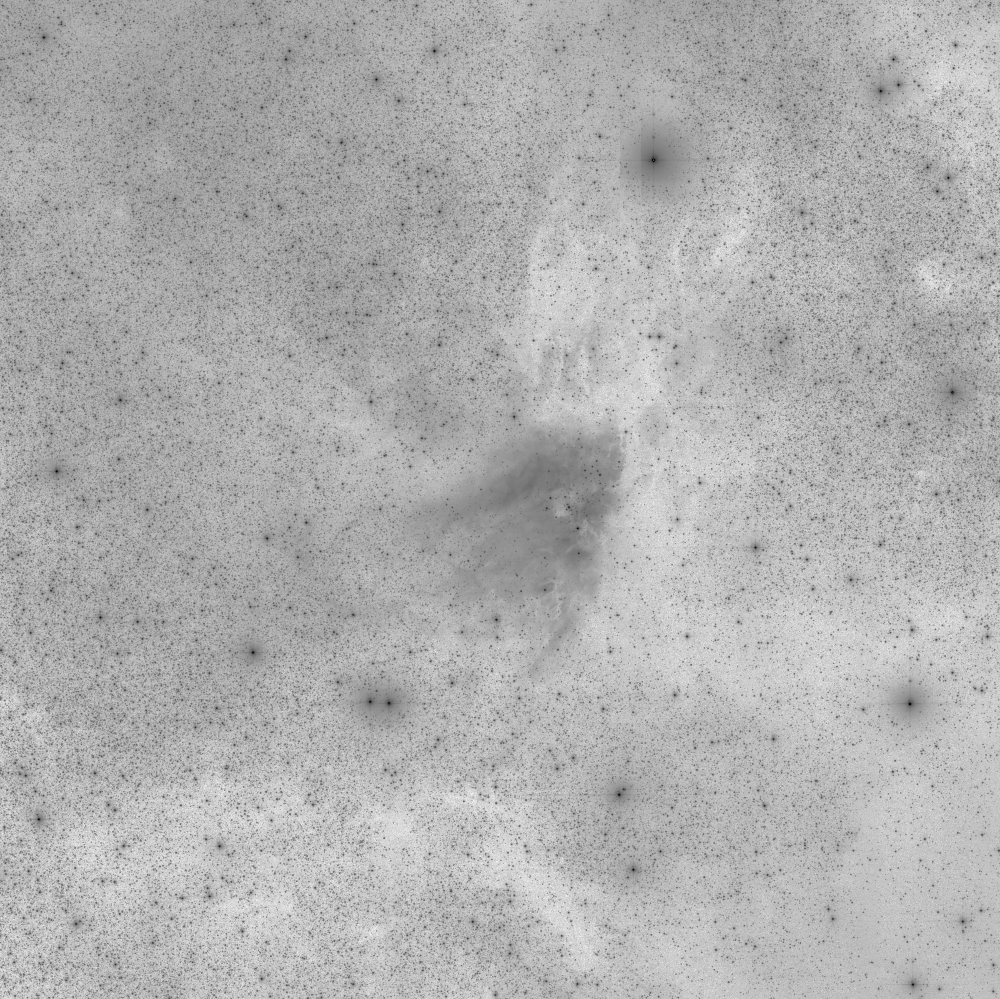

In [10]:
Image(filename='mosaic.png')

## Full Color and Overlays

The above can be packaged up in a Python script with whatever minimum input and defaults you desired.  Repeat the processing for three different wavelengths and you can combine them (and optionally overlays of various sorts) into a full-color image. See our <a style="text-decoration: none;" href="mViewer.ipynb"> mViewer</a> sky visualization notebook for details.
